In [1]:
from pathlib import Path
from getdist import loadMCSamples
import matplotlib.pyplot as plt
import corner
import numpy as np
from common import TRACERS, ZBINS, CHAIN_DIR, PARAM_NAMES_9, PARAM_LABELS_9

I0000 00:00:1789498026.945819  277086 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
I0000 00:00:1789498026.947295  277086 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.
I0000 00:00:1789498027.010599  277086 cpu_feature_guard.cc:227] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
I0000 00:00:1789498028.407089  277086 port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.

/spiffball/cosweeney/data/chains/mocks/LRG_z0.4-0.6_mean.txt
Removed no burn in

=== LRG z0.4-0.6 ===
\begin{tabular} { l  c}

 Parameter &  95\% limits\\
\hline
{\boldmath$h              $} & $0.6750^{+0.0046}_{-0.0046}$\\

{\boldmath$\omega_b       $} & $0.02250^{+0.00069}_{-0.00067}$\\

{\boldmath$\omega_{cdm}   $} & $0.1203^{+0.0066}_{-0.0067}$\\

{\boldmath$\ln(10^{10}A_s)$} & $3.13^{+0.10}_{-0.10}      $\\

{\boldmath$b_1            $} & $0.761^{+0.077}_{-0.069}   $\\

{\boldmath$b_2            $} & $-0.97^{+0.18}_{-0.17}     $\\

{\boldmath$n_s            $} & $0.971^{+0.037}_{-0.039}   $\\

{\boldmath$\Delta_0       $} & $\left(\,2.5^{+3.7}_{-2.6}\,\right)\cdot 10^{-5}$\\

{\boldmath$\Delta_2       $} & $0.000093^{+0.00014}_{-0.000098}$\\
\hline
\end{tabular}
/spiffball/cosweeney/data/chains/mocks/LRG_z0.6-0.8_mean.txt
Removed no burn in

=== LRG z0.6-0.8 ===
\begin{tabular} { l  c}

 Parameter &  95\% limits\\
\hline
{\boldmath$h              $} & $0.6762^{+0.0040}_{-0.0037}$\

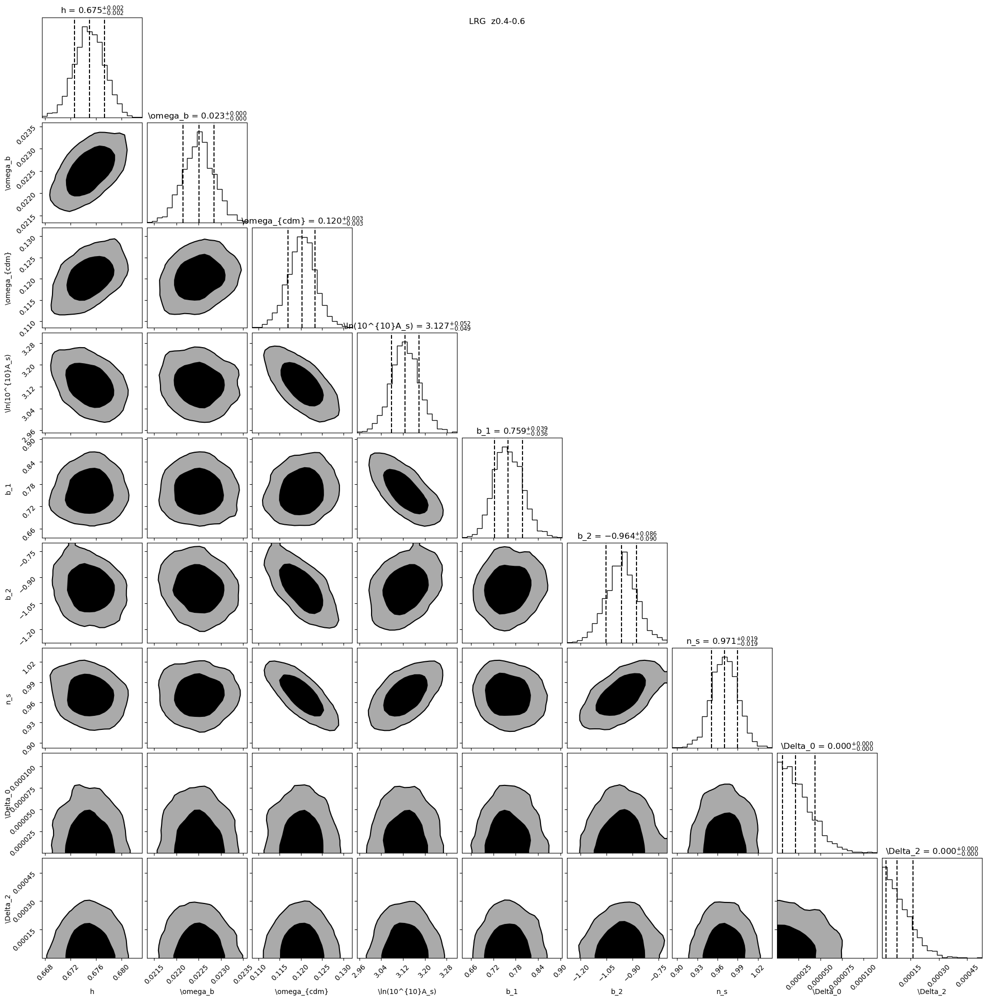

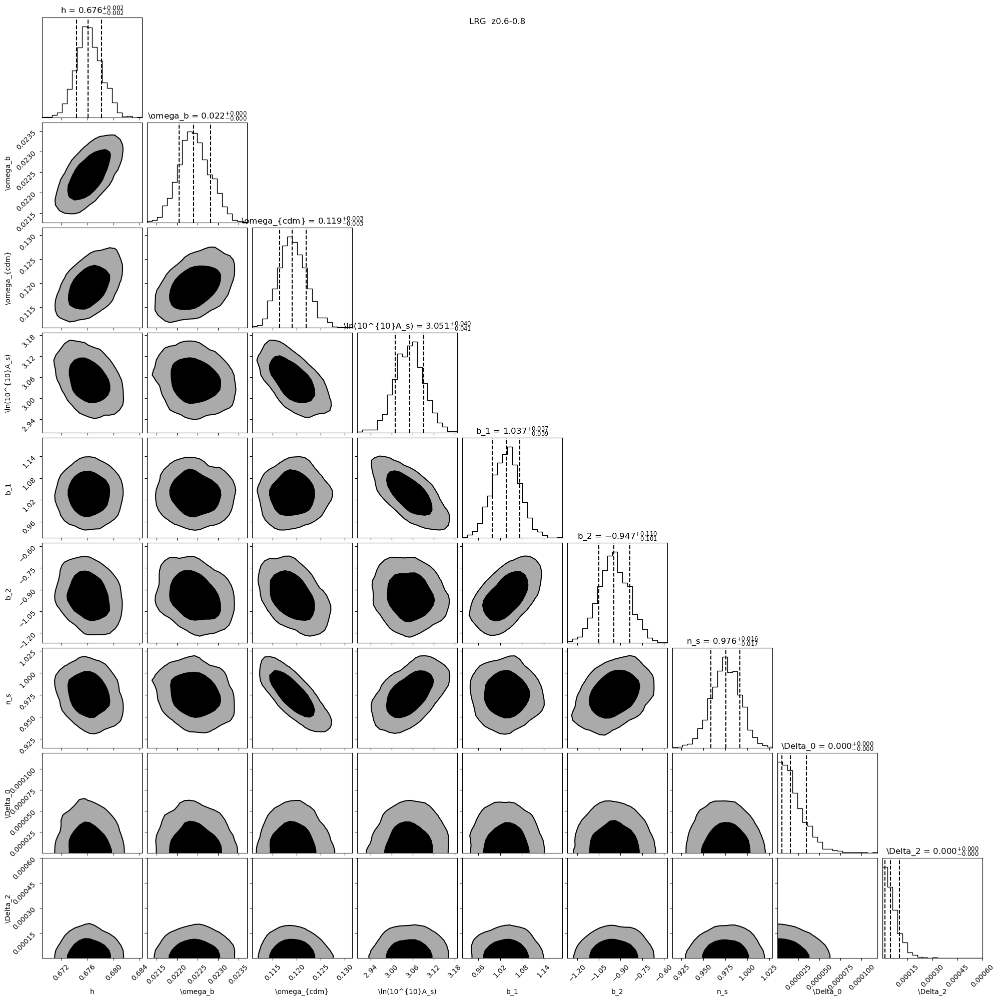

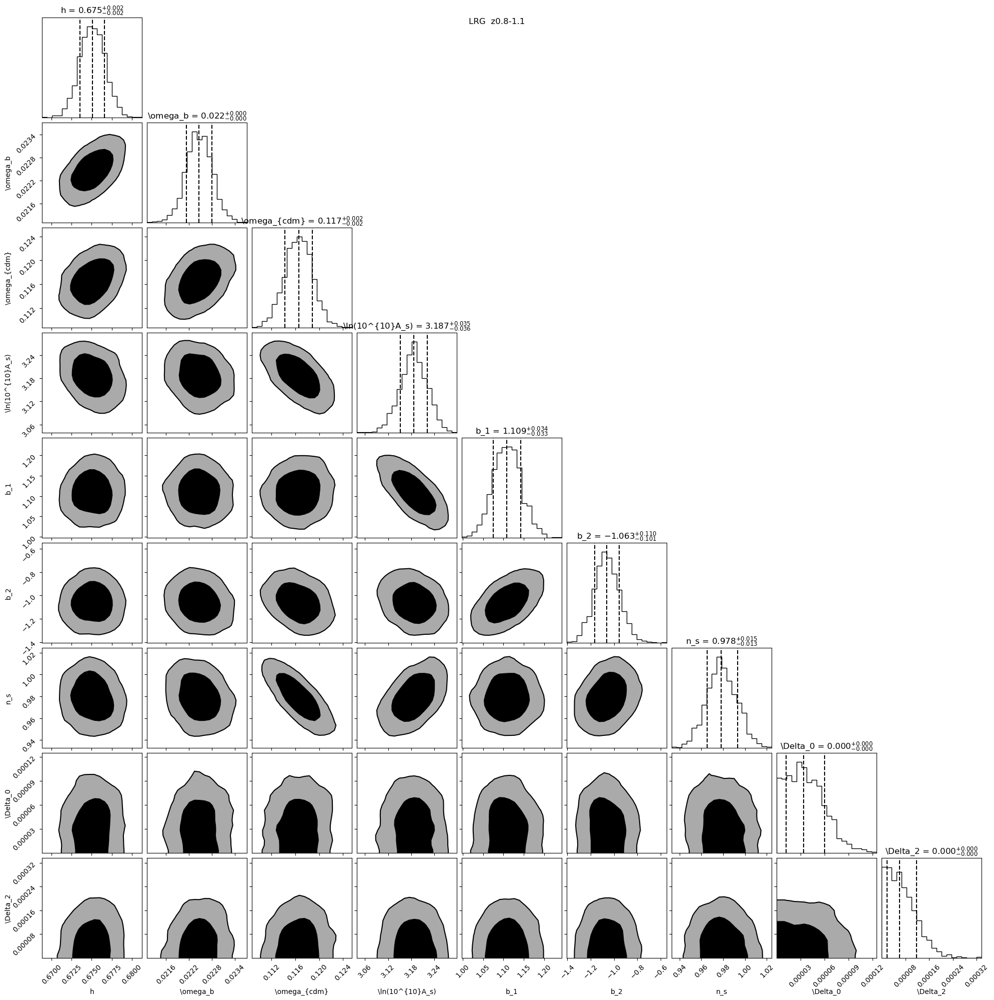

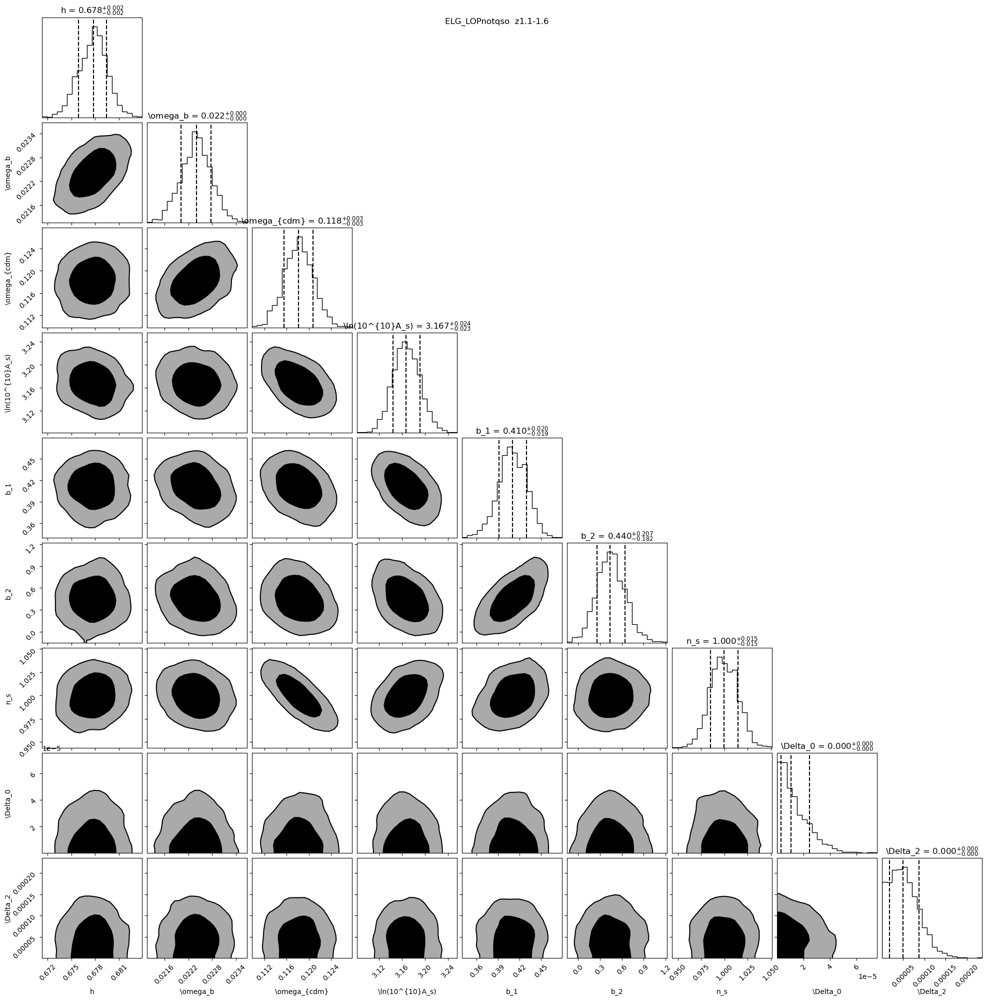

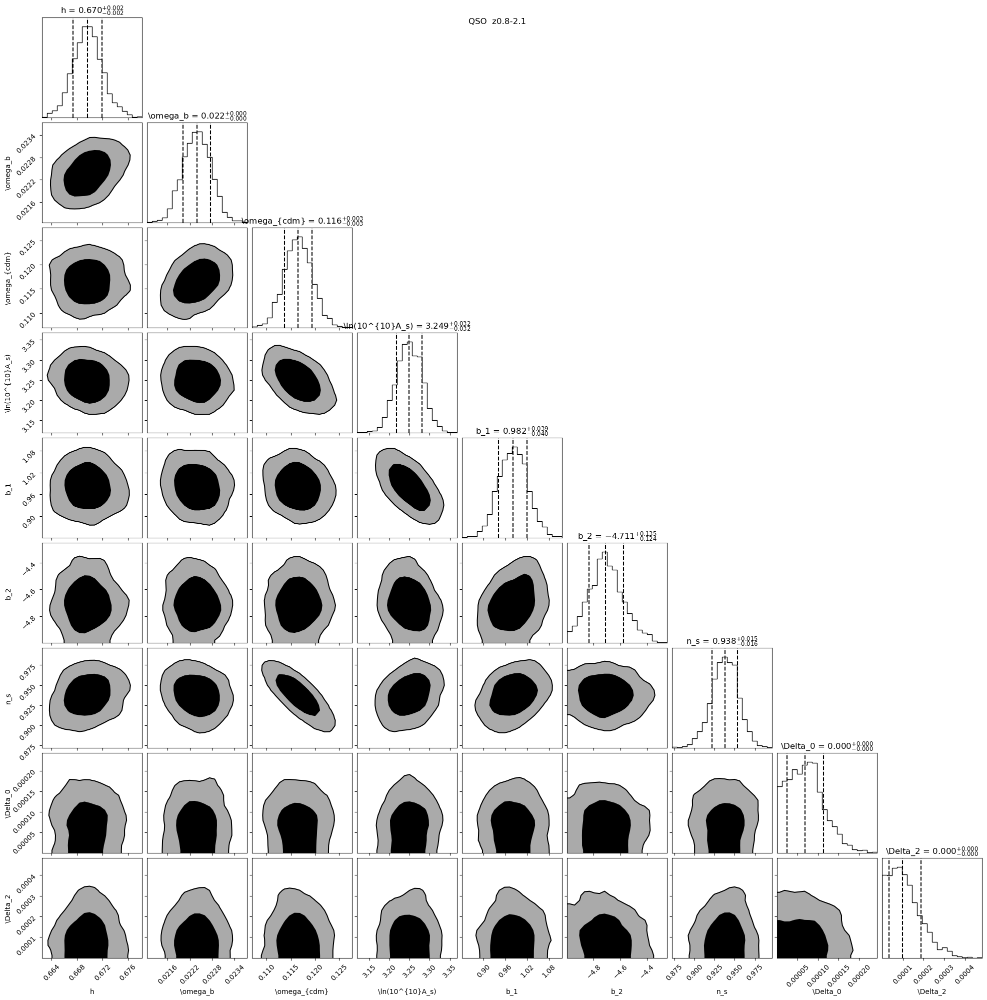

In [2]:

for tracer, prog in TRACERS.items():
    for zmin, zmax in ZBINS[tracer]:
        root = str(CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean')
        try:
            samples = loadMCSamples(root)
        except Exception as e:
            print(f'{tracer} z{zmin}-{zmax}: could not load ({e})')
            continue

        print(f'\n=== {tracer} z{zmin}-{zmax} ===')
        print(samples.getTable().tableTex())   # or drop .tableTex() for a plain-text summary

        flat = np.column_stack([samples.samples[:, i] for i in range(len(PARAM_NAMES_9))])
        fig = corner.corner(flat, labels=PARAM_LABELS_9, show_titles=True, title_fmt='.3f',
                             quantiles=[0.16, 0.5, 0.84], levels=[0.68, 0.95],
                             smooth=1.0, plot_datapoints=False, fill_contours=True)
        fig.suptitle(f'{tracer}  z{zmin}-{zmax}')

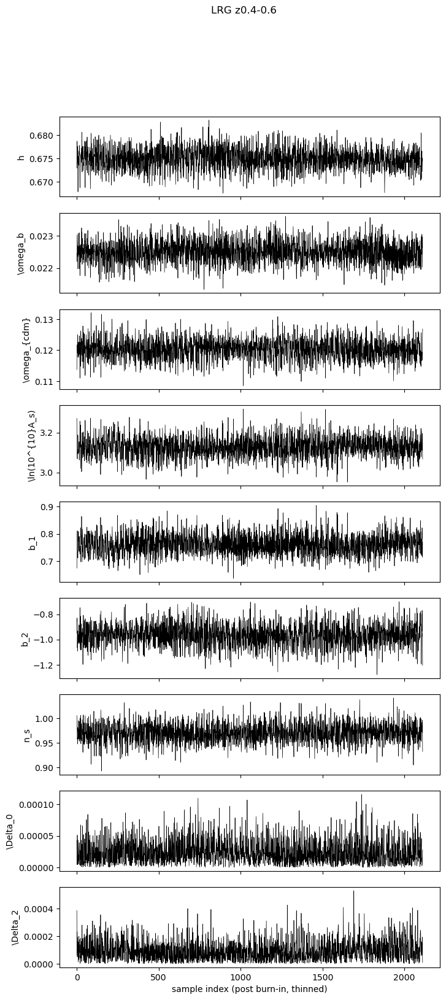

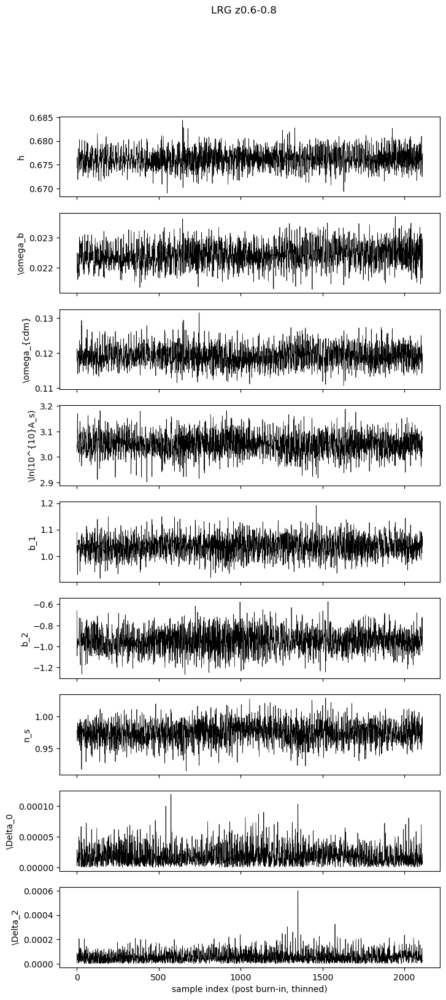

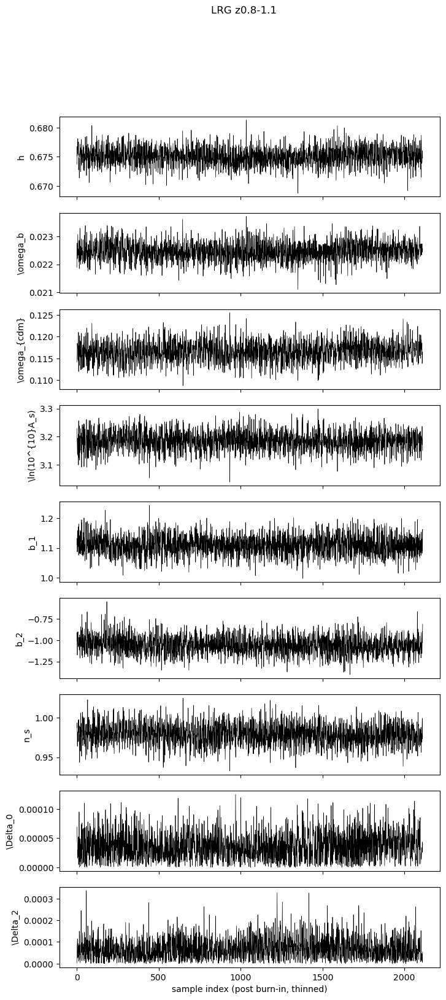

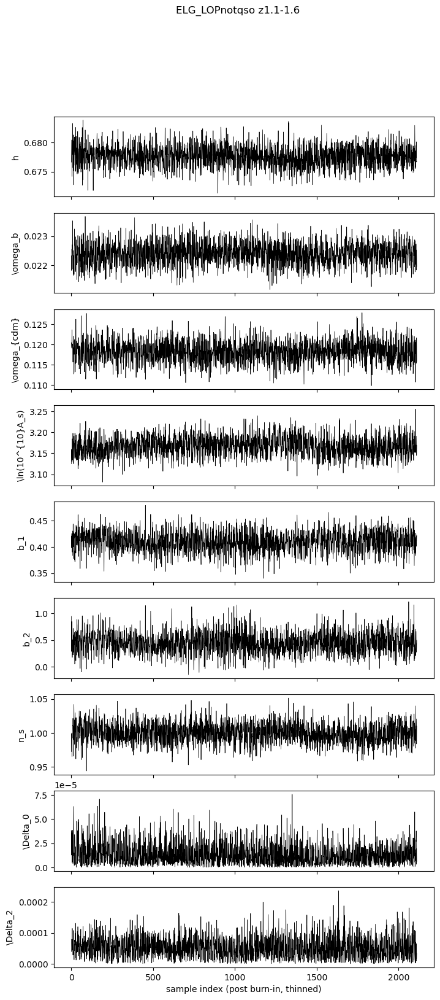

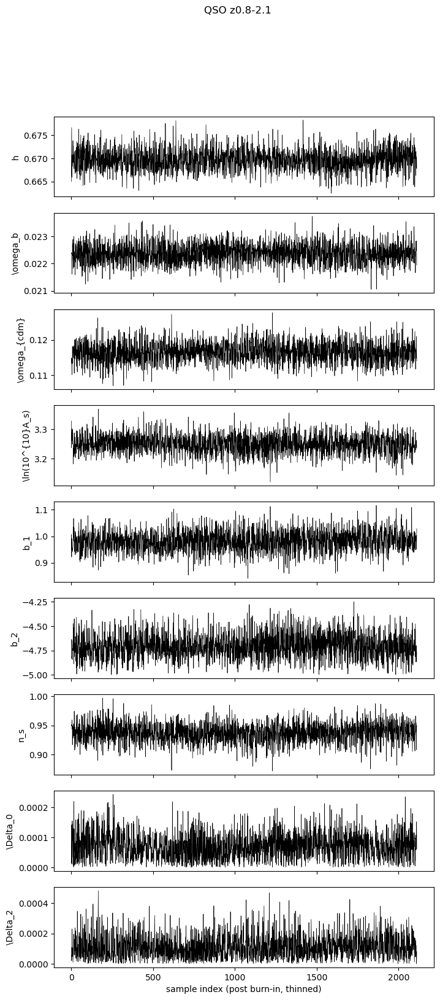

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from common import TRACERS, ZBINS, CHAIN_DIR, PARAM_LABELS_9

for tracer, prog in TRACERS.items():
    for zmin, zmax in ZBINS[tracer]:
        root = CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean'
        try:
            data = np.loadtxt(f'{root}.txt')   # columns: weight, -logpost, params...
        except OSError:
            print(f'{tracer} z{zmin}-{zmax}: no saved chain found')
            continue

        params = data[:, 2:]   # drop weight, -logpost columns
        fig, axes = plt.subplots(params.shape[1], figsize=(8, 2 * params.shape[1]), sharex=True)
        for i, ax in enumerate(axes):
            ax.plot(params[:, i], lw=0.5, color='k')
            ax.set_ylabel(PARAM_LABELS_9[i])
        axes[-1].set_xlabel('sample index (post burn-in, thinned)')
        fig.suptitle(f'{tracer} z{zmin}-{zmax}')

In [3]:
import matplotlib.pyplot as plt
import matplotlib
plt.rcParams['figure.dpi'] = 150   # try 150-300; default inline display is often 72-100

matplotlib.rcParams.update({'text.usetex': True, 
                            'font.family': 'Computer Modern Roman'})
plt.rcParams['axes.labelsize'] = 20

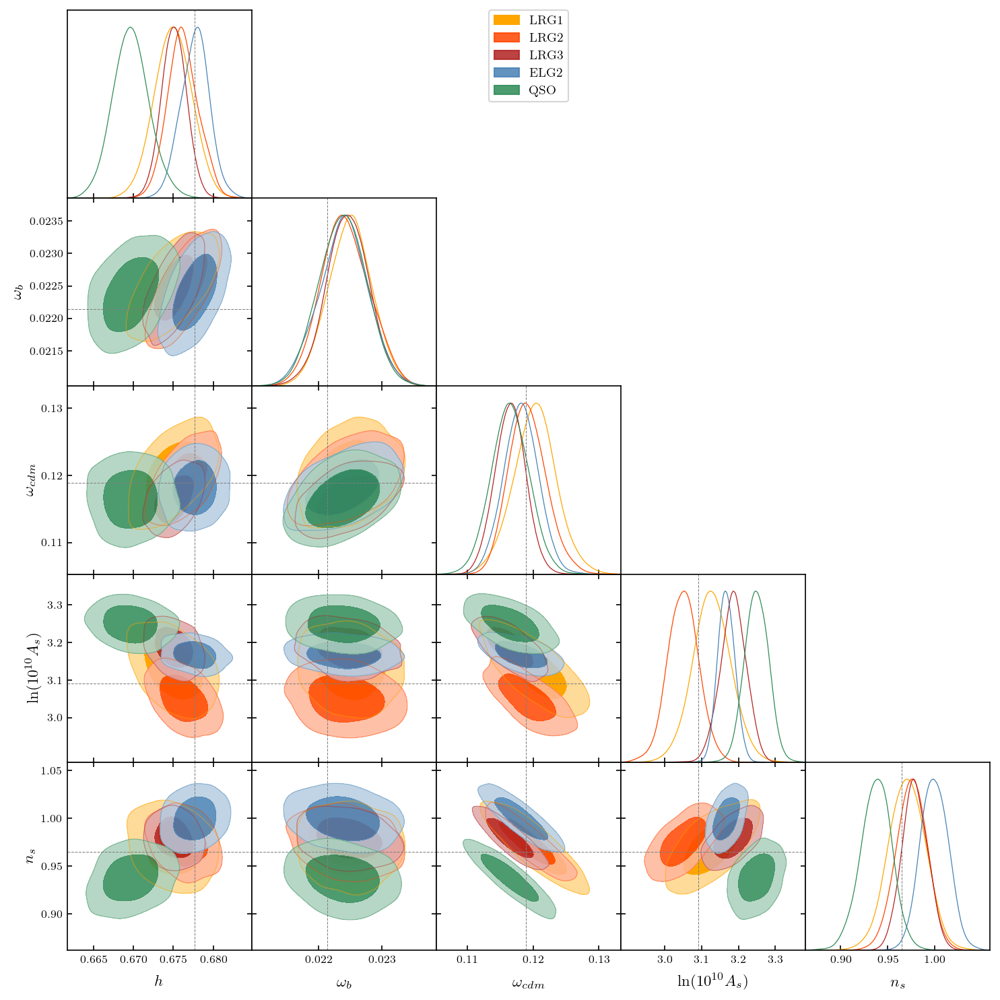

In [22]:
from getdist import loadMCSamples, plots
from common import TRACERS, ZBINS, CHAIN_DIR, COSMO_FID, LNAS_FID, NS_FIXED

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange',
    ('LRG', 0.6, 0.8): 'orangered',
    ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue',
    ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
COSMO_PARAMS = ['h', 'ombh2', 'omch2', 'logA', 'ns']

h_fid, ombh2_fid, omch2_fid, As_fid = COSMO_FID
MARKERS = {'h': h_fid, 'ombh2': ombh2_fid, 'omch2': omch2_fid, 'logA': LNAS_FID, 'ns': NS_FIXED}

samples_list, colors, labels = [], [], []
for tracer, prog in TRACERS.items():
    for zmin, zmax in ZBINS[tracer]:
        key = (tracer, zmin, zmax)
        root = str(CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean')
        try:
            #settings = {'smooth_scale_2D': 0.8, 'fine_bins_2D': 2048}
            s = loadMCSamples(root)
        except Exception as e:
            print(f'{tracer} z{zmin}-{zmax}: could not load ({e})')
            continue
        samples_list.append(s)
        colors.append(TRACER_COLORS[key])
        labels.append(LEGEND_LABELS[key])

g = plots.get_subplot_plotter()
g.triangle_plot(samples_list, COSMO_PARAMS, filled=True,
                 contour_colors=colors, legend_labels=labels,
                 markers=MARKERS)

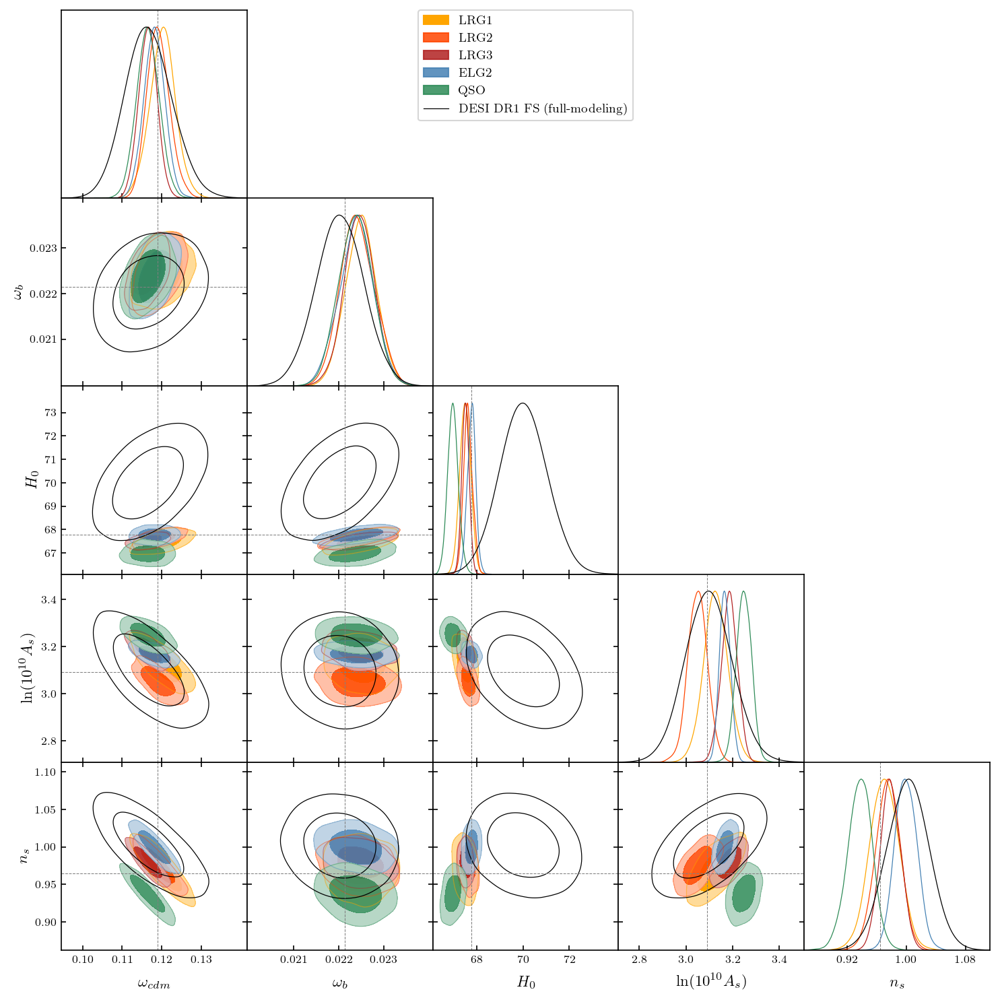

In [31]:
from getdist import loadMCSamples, plots
from common import TRACERS, ZBINS, CHAIN_DIR, COSMO_FID, LNAS_FID

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
COSMO_PARAMS = ['omch2', 'ombh2', 'H0', 'logA', 'ns']

h_fid, ombh2_fid, omch2_fid, As_fid = COSMO_FID
MARKERS = {'H0': 100. * h_fid, 'ombh2': ombh2_fid, 'omch2': omch2_fid, 'logA': LNAS_FID, 'ns': NS_FIXED}

samples_list, colors, labels = [], [], []
for tracer, prog in TRACERS.items():
    for zmin, zmax in ZBINS[tracer]:
        key = (tracer, zmin, zmax)
        root = str(CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean')
        try:
            s = loadMCSamples(root)
        except Exception as e:
            print(f'{tracer} z{zmin}-{zmax}: could not load ({e})')
            continue
        s.addDerived(100. * s.getParams().h, name='H0', label='H_0')

        samples_list.append(s)
        colors.append(TRACER_COLORS[key])
        labels.append(LEGEND_LABELS[key])

base = "/spiffball/cosweeney/DESI/DR1/full-shape-cosmo-params/v1.0/cobaya/base/desi-reptvelocileptors-fs-all_schoneberg2024-bbn_planck2018-ns10/"
desi_samples = loadMCSamples(f"{base}chain")

samples_list.append(desi_samples)
colors.append('black')
labels.append('DESI DR1 FS (full-modeling)')

g = plots.get_subplot_plotter()
g.triangle_plot(samples_list, COSMO_PARAMS, filled=[True, True, True, True, True, False],
                 contour_colors=colors, legend_labels=labels, markers=MARKERS)

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


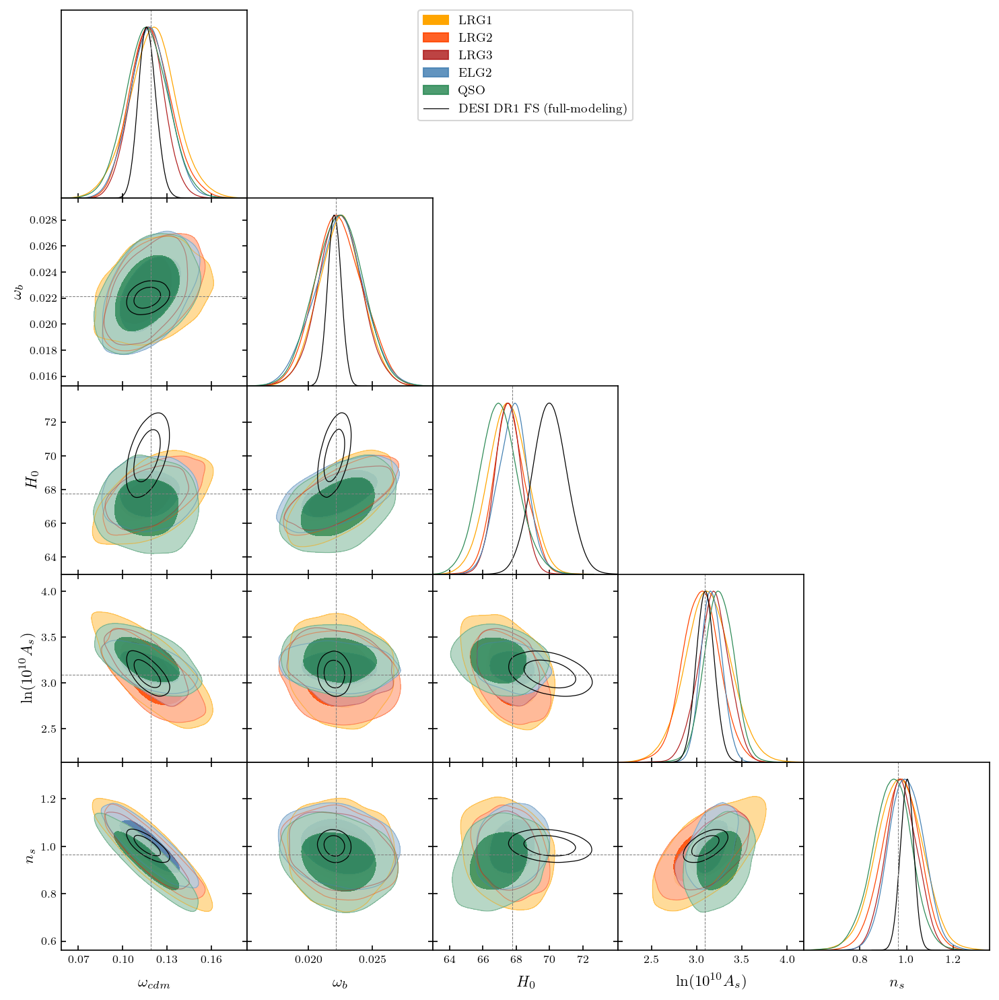

In [32]:
import numpy as np
from getdist import loadMCSamples, MCSamples, plots
from common import TRACERS, ZBINS, CHAIN_DIR, COSMO_FID, LNAS_FID, load_tracer_arrays

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}

COSMO_PARAMS = ['omch2', 'ombh2', 'H0', 'logA', 'ns']

h_fid, ombh2_fid, omch2_fid, As_fid = COSMO_FID
MARKERS = {'H0': 100. * h_fid, 'ombh2': ombh2_fid, 'omch2': omch2_fid, 'logA': LNAS_FID, 'ns': NS_FIXED}

def rescale_samples(samples, scale):
    """Approximate: broaden all params about their mean by `scale`."""
    names = samples.paramNames.list()
    labels = [p.label for p in samples.paramNames.names]
    arr = samples.samples.copy()
    arr = arr.mean(axis=0) + scale * (arr - arr.mean(axis=0))
    return MCSamples(samples=arr, weights=samples.weights, names=names, labels=labels)


samples_list, colors, labels = [], [], []
for tracer, prog in TRACERS.items():
    for zmin, zmax in ZBINS[tracer]:
        key = (tracer, zmin, zmax)
        root = str(CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean')
        try:
            s = loadMCSamples(root)
        except Exception as e:
            print(f'{tracer} z{zmin}-{zmax}: could not load ({e})')
            continue
        s.addDerived(100. * s.getParams().h, name='H0', label='H_0')

        _, poles, _, _ = load_tracer_arrays(tracer, prog, zmin, zmax)
        nmock_avail = poles.shape[0]
        s_scaled = rescale_samples(s, np.sqrt(nmock_avail))

        samples_list.append(s_scaled)
        colors.append(TRACER_COLORS[key])
        labels.append(LEGEND_LABELS[key])

base = "/spiffball/cosweeney/DESI/DR1/full-shape-cosmo-params/v1.0/cobaya/base/desi-reptvelocileptors-fs-all_schoneberg2024-bbn_planck2018-ns10/"
desi_samples = loadMCSamples(f"{base}chain")

samples_list.append(desi_samples)
colors.append('black')
labels.append('DESI DR1 FS (full-modeling)')

g = plots.get_subplot_plotter()
g.triangle_plot(samples_list, COSMO_PARAMS, filled=[True, True, True, True, True, False],
                 contour_colors=colors, legend_labels=labels, markers=MARKERS)

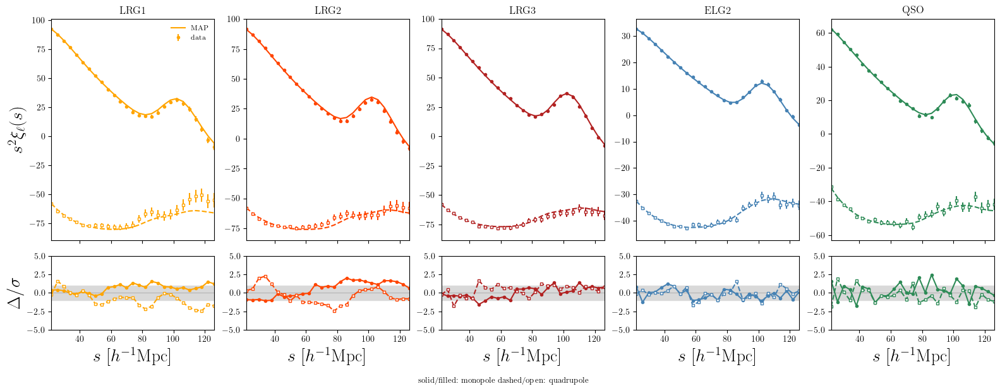

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from common import (TRACERS, ZBINS, Z_EFF, load_tracer_arrays, data_vec_from,
                     model_multipoles, get_emulators_cached, CHAIN_DIR)

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange',
    ('LRG', 0.6, 0.8): 'orangered',
    ('LRG', 0.8, 1.1): 'firebrick',
    # ('ELG_LOPnotqso', 0.8, 1.1): 'skyblue',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue',
    ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    # ('ELG_LOPnotqso', 0.8, 1.1): 'ELG1', 
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2',
    ('QSO', 0.8, 2.1): 'QSO',
}

def get_map_theta(root):
    data = np.loadtxt(f'{root}.txt')
    best = data[np.argmin(data[:, 1])]
    return best[2:]

# only include tracer/zbins whose mean-fit chain actually exists on disk
FIT_KEYS = []
for tracer, prog in TRACERS.items():
    for zmin, zmax in ZBINS[tracer]:
        root = CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean'
        if Path(f'{root}.txt').exists():
            FIT_KEYS.append((tracer, zmin, zmax))
        else:
            print(f'skipping {tracer} z{zmin}-{zmax}: no chain found at {root}.txt')

n_fits = len(FIT_KEYS)
fig, axes = plt.subplots(2, n_fits, figsize=(3.2 * n_fits, 6), sharex='col',
                          gridspec_kw={'height_ratios': [3, 1]})

for col, key in enumerate(FIT_KEYS):
    tracer, zmin, zmax = key
    prog = TRACERS[tracer]
    color = TRACER_COLORS[key]
    ax_top, ax_bot = axes[0, col], axes[1, col]

    z_eff = Z_EFF[key]
    s_data, poles, mask, cov = load_tracer_arrays(tracer, prog, zmin, zmax)
    nmock_avail = poles.shape[0]
    n_per_ell = len(s_data)
    data_vec = data_vec_from(poles, mask, mock_idx=None)
    cov_mean = cov / nmock_avail
    err = np.sqrt(np.diag(cov_mean))

    root = str(CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean')
    theta_map = get_map_theta(root)
    emus = get_emulators_cached(z_eff)
    model = model_multipoles(theta_map, emus, z_eff, s_data)

    xi0_d, xi2_d = np.split(data_vec, 2)
    xi0_m, xi2_m = np.split(model, 2)
    err0, err2 = err[:n_per_ell], err[n_per_ell:]

    ax_top.errorbar(s_data, s_data**2 * xi0_d, s_data**2 * err0, fmt='o', ms=3, color=color, label='data')
    ax_top.errorbar(s_data, s_data**2 * xi2_d, s_data**2 * err2, fmt='s', ms=3, mfc='white', color=color)
    ax_top.plot(s_data, s_data**2 * xi0_m, '-', color=color, label='MAP')
    ax_top.plot(s_data, s_data**2 * xi2_m, '--', color=color)
    ax_top.set_title(LEGEND_LABELS[key])
    ax_top.margins(x=0)

    ax_bot.axhspan(-1, 1, color='0.85', zorder=0)
    ax_bot.axhline(0, color='0.7', lw=0.8)
    ax_bot.plot(s_data, (xi0_m - xi0_d) / err0, 'o-', ms=3, color=color)
    ax_bot.plot(s_data, (xi2_m - xi2_d) / err2, 's--', ms=3, mfc='white', color=color)
    ax_bot.set_ylim(-5, 5)
    ax_bot.margins(x=0)
    ax_bot.set_xlabel(r'$s\ [h^{-1}\mathrm{Mpc}]$')

axes[0, 0].set_ylabel(r'$s^2\xi_\ell(s)$')
axes[1, 0].set_ylabel(r'$\Delta/\sigma$')
axes[0, 0].legend(frameon=False, fontsize=8)

fig.text(0.5, -0.02, 'solid/filled: monopole    dashed/open: quadrupole', ha='center', fontsize=9)
fig.tight_layout()

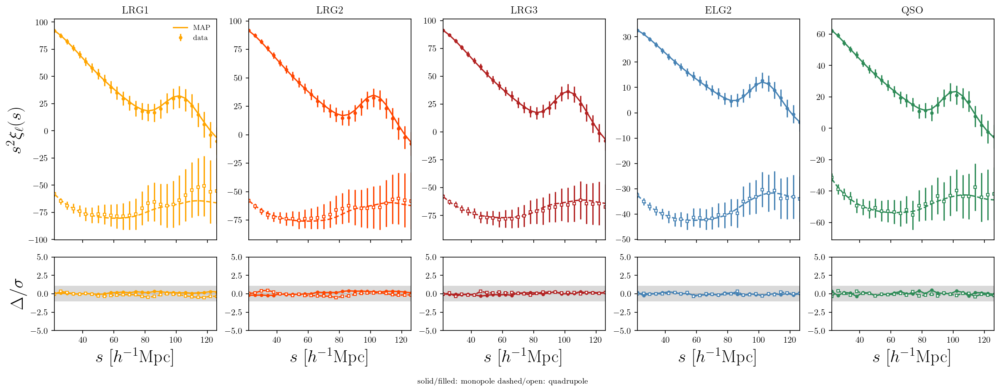

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from common import (TRACERS, ZBINS, Z_EFF, load_tracer_arrays, data_vec_from,
                     model_multipoles, get_emulators_cached, CHAIN_DIR)

def get_map_theta(root):
    data = np.loadtxt(f'{root}.txt')
    best = data[np.argmin(data[:, 1])]
    return best[2:]

FIT_KEYS = []
for tracer, prog in TRACERS.items():
    for zmin, zmax in ZBINS[tracer]:
        root = CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean'
        if Path(f'{root}.txt').exists():
            FIT_KEYS.append((tracer, zmin, zmax))
        else:
            print(f'skipping {tracer} z{zmin}-{zmax}: no chain found at {root}.txt')

n_fits = len(FIT_KEYS)
fig, axes = plt.subplots(2, n_fits, figsize=(3.2 * n_fits, 6), sharex='col',
                          gridspec_kw={'height_ratios': [3, 1]})

for col, key in enumerate(FIT_KEYS):
    tracer, zmin, zmax = key
    prog = TRACERS[tracer]
    color = TRACER_COLORS[key]
    ax_top, ax_bot = axes[0, col], axes[1, col]

    z_eff = Z_EFF[key]
    s_data, poles, mask, cov = load_tracer_arrays(tracer, prog, zmin, zmax)
    n_per_ell = len(s_data)
    data_vec = data_vec_from(poles, mask, mock_idx=None)
    err = np.sqrt(np.diag(cov))   # unscaled -- no /nmock_avail

    root = str(CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mean')
    theta_map = get_map_theta(root)
    emus = get_emulators_cached(z_eff)
    model = model_multipoles(theta_map, emus, z_eff, s_data)

    xi0_d, xi2_d = np.split(data_vec, 2)
    xi0_m, xi2_m = np.split(model, 2)
    err0, err2 = err[:n_per_ell], err[n_per_ell:]

    ax_top.errorbar(s_data, s_data**2 * xi0_d, s_data**2 * err0, fmt='o', ms=3, color=color, label='data')
    ax_top.errorbar(s_data, s_data**2 * xi2_d, s_data**2 * err2, fmt='s', ms=3, mfc='white', color=color)
    ax_top.plot(s_data, s_data**2 * xi0_m, '-', color=color, label='MAP')
    ax_top.plot(s_data, s_data**2 * xi2_m, '--', color=color)
    ax_top.set_title(LEGEND_LABELS[key])
    ax_top.margins(x=0)

    ax_bot.axhspan(-1, 1, color='0.85', zorder=0)
    ax_bot.axhline(0, color='0.7', lw=0.8)
    ax_bot.plot(s_data, (xi0_m - xi0_d) / err0, 'o-', ms=3, color=color)
    ax_bot.plot(s_data, (xi2_m - xi2_d) / err2, 's--', ms=3, mfc='white', color=color)
    ax_bot.set_ylim(-5, 5)
    ax_bot.margins(x=0)
    ax_bot.set_xlabel(r'$s\ [h^{-1}\mathrm{Mpc}]$')

axes[0, 0].set_ylabel(r'$s^2\xi_\ell(s)$')
axes[1, 0].set_ylabel(r'$\Delta/\sigma$')
axes[0, 0].legend(frameon=False, fontsize=8)
fig.text(0.5, -0.02, 'solid/filled: monopole    dashed/open: quadrupole', ha='center', fontsize=9)
fig.tight_layout()

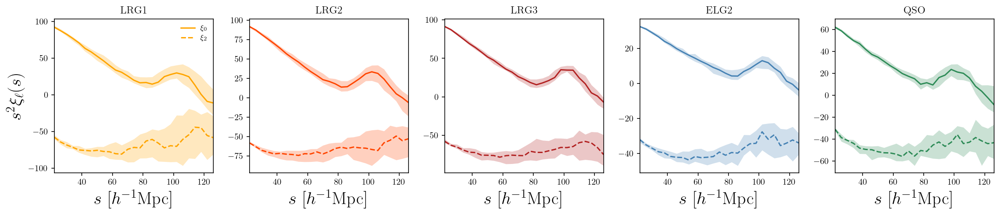

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from common import TRACERS, ZBINS, Z_EFF, load_tracer_arrays, data_vec_from, CHAIN_DIR

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}

FIT_KEYS = [k for tracer in TRACERS for k in [(tracer, *zb) for zb in ZBINS[tracer]]]
n_fits = len(FIT_KEYS)
fig, axes = plt.subplots(1, n_fits, figsize=(3.2 * n_fits, 3.5), sharey=False)

for col, key in enumerate(FIT_KEYS):
    tracer, zmin, zmax = key
    prog = TRACERS[tracer]
    color = TRACER_COLORS[key]
    ax = axes[col]

    s_data, poles, mask, cov = load_tracer_arrays(tracer, prog, zmin, zmax)
    n_per_ell = len(s_data)
    mean_vec = data_vec_from(poles, mask, mock_idx=None)

    # per-mock xi0, xi2 (no MAP curves here -- just the measured multipoles across mocks)
    xi0_all = np.array([poles[i, 0][mask] for i in range(poles.shape[0])])
    xi2_all = np.array([poles[i, 1][mask] for i in range(poles.shape[0])])

    for xi_all, ls, label in [(xi0_all, '-', r'$\xi_0$'), (xi2_all, '--', r'$\xi_2$')]:
        med = np.median(xi_all, axis=0)
        lo, hi = np.percentile(xi_all, [16, 84], axis=0)
        ax.fill_between(s_data, s_data**2 * lo, s_data**2 * hi, color=color, alpha=0.25, lw=0)
        ax.plot(s_data, s_data**2 * med, ls, color=color, label=label)

    ax.set_title(LEGEND_LABELS[key])
    ax.margins(x=0)
    ax.set_xlabel(r'$s\ [h^{-1}\mathrm{Mpc}]$')

axes[0].set_ylabel(r'$s^2\xi_\ell(s)$')
axes[0].legend(frameon=False, fontsize=8)
fig.tight_layout()

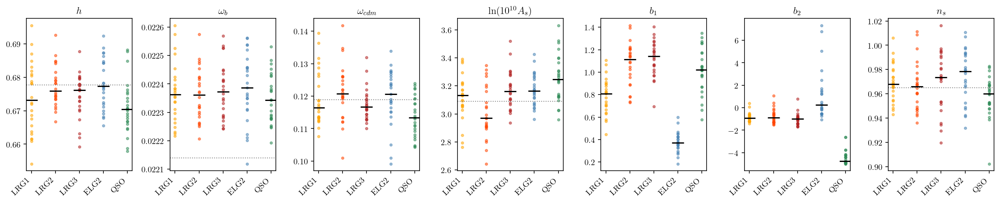

In [35]:
import numpy as np
import matplotlib.pyplot as plt
from common import TRACERS, ZBINS, CHAIN_DIR, PARAM_NAMES_7, PARAM_LABELS_7, COSMO_FID, LNAS_FID, NS_FIXED

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [k for tracer in TRACERS for k in [(tracer, *zb) for zb in ZBINS[tracer]]]

FID_VALUES = {'h': COSMO_FID[0], 'ombh2': COSMO_FID[1], 'omch2': COSMO_FID[2],
              'logA': LNAS_FID, 'ns': NS_FIXED}

n_params = len(PARAM_NAMES_7)
fig, axes = plt.subplots(1, n_params, figsize=(2.4 * n_params, 3.5))

for col, (name, label) in enumerate(zip(PARAM_NAMES_7, PARAM_LABELS_7)):
    ax = axes[col]
    for x, key in enumerate(FIT_KEYS):
        tracer, zmin, zmax = key
        maps = []
        mock_idx = 0
        while (root_txt := CHAIN_DIR / f'{tracer}_z{zmin}-{zmax}_mock{mock_idx}.txt').exists():
            data = np.loadtxt(root_txt)
            best = data[np.argmin(data[:, 1])]
            maps.append(best[2 + col])
            mock_idx += 1
        if not maps:
            continue
        ax.scatter([x] * len(maps), maps, s=8, alpha=0.5, color=TRACER_COLORS[key])
        ax.scatter([x], [np.median(maps)], marker='_', s=200, color='k', zorder=5)

    if name in FID_VALUES:
        ax.axhline(FID_VALUES[name], color='gray', ls=':', lw=1)
    ax.set_xticks(range(len(FIT_KEYS)))
    ax.set_xticklabels([LEGEND_LABELS[k] for k in FIT_KEYS], rotation=45, ha='right')
    ax.set_title(f'${label}$')   # wrap in math delimiters -- avoids raw-LaTeX/mathtext parse errors

fig.tight_layout()

/spiffball/cosweeney/data/chains/mocks/joint_mean_unscaledcov.txt
Removed no burn in


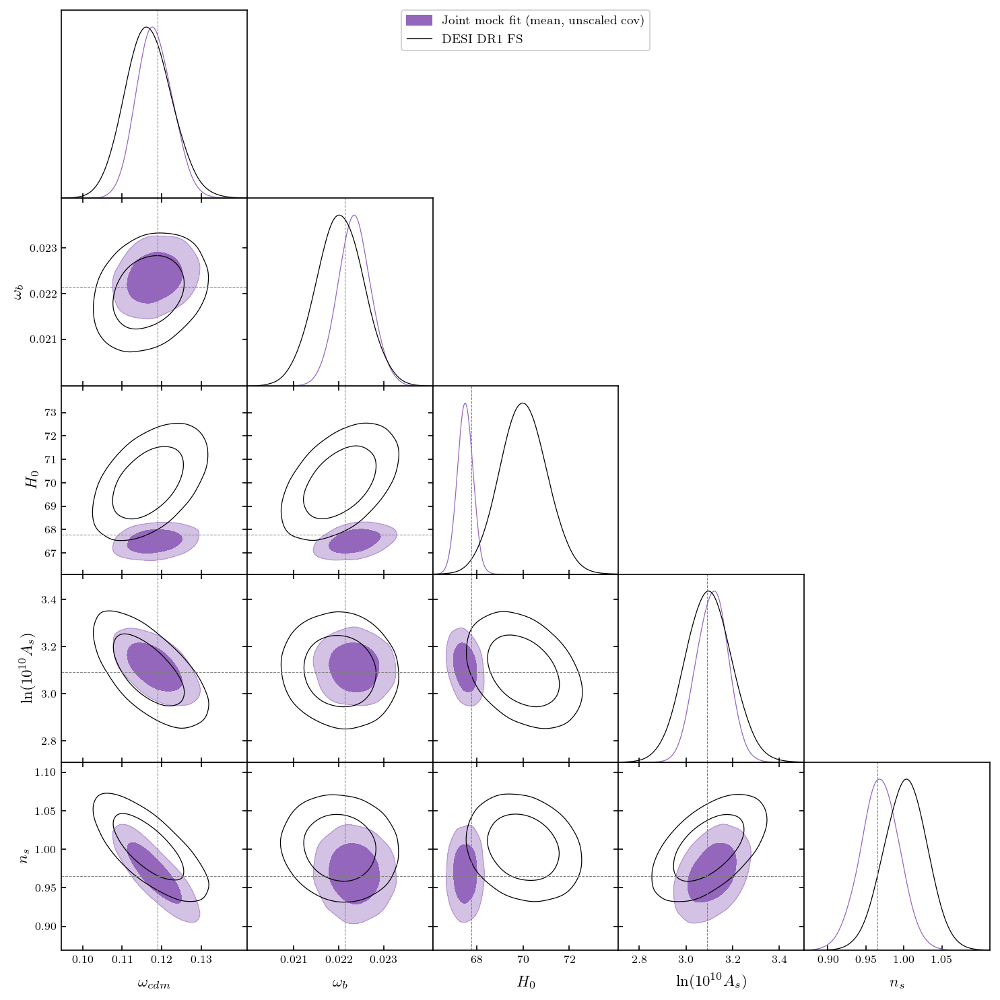

In [36]:
from getdist import loadMCSamples, plots
from common import CHAIN_DIR, COSMO_FID, LNAS_FID, NS_FIXED

COSMO_PARAMS = ['omch2', 'ombh2', 'H0', 'logA', 'ns']
h_fid, ombh2_fid, omch2_fid, As_fid = COSMO_FID
MARKERS = {'H0': 100. * h_fid, 'ombh2': ombh2_fid, 'omch2': omch2_fid, 'logA': LNAS_FID, 'ns': NS_FIXED}

root = str(CHAIN_DIR / 'joint_mean_unscaledcov')
joint = loadMCSamples(root)
joint.addDerived(100. * joint.getParams().h, name='H0', label='H_0')

base = "/spiffball/cosweeney/DESI/DR1/full-shape-cosmo-params/v1.0/cobaya/base/desi-reptvelocileptors-fs-all_schoneberg2024-bbn_planck2018-ns10/"
desi_samples = loadMCSamples(f"{base}chain")

g = plots.get_subplot_plotter()
g.triangle_plot([joint, desi_samples], COSMO_PARAMS, filled=[True, False],
                 contour_colors=['tab:purple', 'black'],
                 legend_labels=['Joint mock fit (mean, unscaled cov)', 'DESI DR1 FS'],
                 markers=MARKERS)

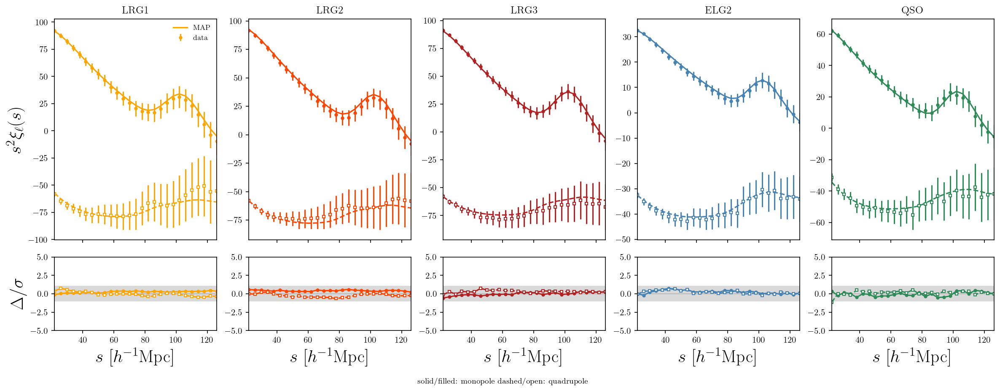

In [37]:
import numpy as np
import matplotlib.pyplot as plt
from common import (TRACERS, ZBINS, Z_EFF, load_tracer_arrays, data_vec_from,
                     model_multipoles, get_emulators_cached, CHAIN_DIR)

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

root = CHAIN_DIR / 'joint_mean_unscaledcov'
data = np.loadtxt(f'{root}.txt')
best = data[np.argmin(data[:, 1])]
theta_full = best[2:]   # h, ombh2, omch2, logA, ns, then b1/b2 per fit in FIT_KEYS order

h, ombh2, omch2, lnAs, ns = theta_full[:5]

n_fits = len(FIT_KEYS)
fig, axes = plt.subplots(2, n_fits, figsize=(3.2 * n_fits, 6), sharex='col',
                          gridspec_kw={'height_ratios': [3, 1]})

for col, key in enumerate(FIT_KEYS):
    tracer, zmin, zmax = key
    prog = TRACERS[tracer]
    color = TRACER_COLORS[key]
    ax_top, ax_bot = axes[0, col], axes[1, col]

    b1, b2 = theta_full[5 + 2 * col], theta_full[5 + 2 * col + 1]
    theta_i = [h, ombh2, omch2, lnAs, b1, b2, ns]

    z_eff = Z_EFF[key]
    s_data, poles, mask, cov = load_tracer_arrays(tracer, prog, zmin, zmax)
    n_per_ell = len(s_data)
    data_vec = data_vec_from(poles, mask, mock_idx=None)
    err = np.sqrt(np.diag(cov))   # unscaled -- matches what the joint fit actually used

    emus = get_emulators_cached(z_eff)
    model = model_multipoles(theta_i, emus, z_eff, s_data)

    xi0_d, xi2_d = np.split(data_vec, 2)
    xi0_m, xi2_m = np.split(model, 2)
    err0, err2 = err[:n_per_ell], err[n_per_ell:]

    ax_top.errorbar(s_data, s_data**2 * xi0_d, s_data**2 * err0, fmt='o', ms=3, color=color, label='data')
    ax_top.errorbar(s_data, s_data**2 * xi2_d, s_data**2 * err2, fmt='s', ms=3, mfc='white', color=color)
    ax_top.plot(s_data, s_data**2 * xi0_m, '-', color=color, label='MAP')
    ax_top.plot(s_data, s_data**2 * xi2_m, '--', color=color)
    ax_top.set_title(LEGEND_LABELS[key])
    ax_top.margins(x=0)

    ax_bot.axhspan(-1, 1, color='0.85', zorder=0)
    ax_bot.axhline(0, color='0.7', lw=0.8)
    ax_bot.plot(s_data, (xi0_m - xi0_d) / err0, 'o-', ms=3, color=color)
    ax_bot.plot(s_data, (xi2_m - xi2_d) / err2, 's--', ms=3, mfc='white', color=color)
    ax_bot.set_ylim(-5, 5)
    ax_bot.margins(x=0)
    ax_bot.set_xlabel(r'$s\ [h^{-1}\mathrm{Mpc}]$')

axes[0, 0].set_ylabel(r'$s^2\xi_\ell(s)$')
axes[1, 0].set_ylabel(r'$\Delta/\sigma$')
axes[0, 0].legend(frameon=False, fontsize=8)
fig.text(0.5, -0.02, 'solid/filled: monopole    dashed/open: quadrupole', ha='center', fontsize=9)
fig.tight_layout()

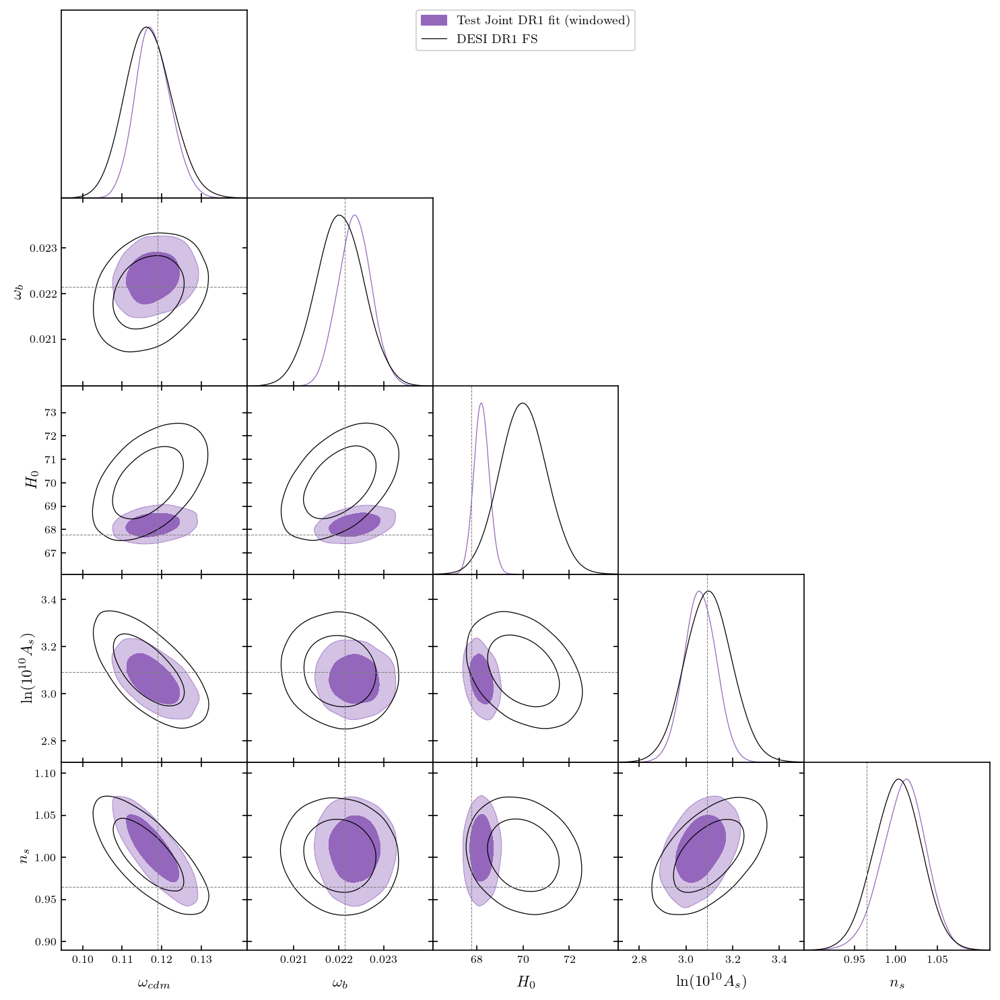

In [4]:
from getdist import loadMCSamples, plots
from common import CHAIN_DIR, COSMO_FID, LNAS_FID, NS_FIXED

COSMO_PARAMS = ['omch2', 'ombh2', 'H0', 'logA', 'ns']
h_fid, ombh2_fid, omch2_fid, As_fid = COSMO_FID
MARKERS = {'H0': 100. * h_fid, 'ombh2': ombh2_fid, 'omch2': omch2_fid, 'logA': LNAS_FID, 'ns': NS_FIXED}

root = str(CHAIN_DIR / 'joint_dr1_windowed')
joint = loadMCSamples(root)
joint.addDerived(100. * joint.getParams().h, name='H0', label='H_0')

base = "/spiffball/cosweeney/DESI/DR1/full-shape-cosmo-params/v1.0/cobaya/base/desi-reptvelocileptors-fs-all_schoneberg2024-bbn_planck2018-ns10/"
desi_samples = loadMCSamples(f"{base}chain")

g = plots.get_subplot_plotter()
g.triangle_plot([joint, desi_samples], COSMO_PARAMS, filled=[True, False],
                 contour_colors=['tab:purple', 'black'],
                 legend_labels=['Test Joint DR1 fit (windowed)', 'DESI DR1 FS'],
                 markers=MARKERS)

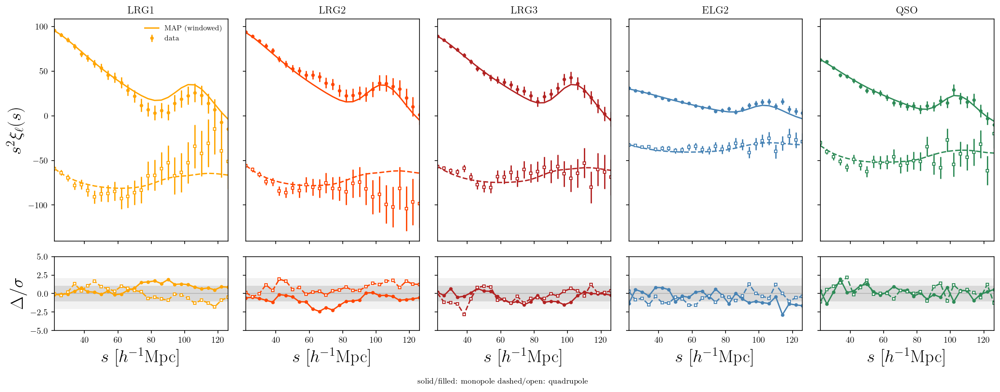

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from common import TRACERS, ZBINS, Z_EFF, get_emulators_cached, CHAIN_DIR
from fit_joint_DR1_windowed_test import load_dr1_tracer_arrays, model_multipoles_windowed, NRAN

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

root = CHAIN_DIR / 'joint_dr1_windowed'
data = np.loadtxt(f'{root}.txt')
best = data[np.argmin(data[:, 1])]
theta_full = best[2:]   # h, ombh2, omch2, logA, ns, then b1/b2 per fit in FIT_KEYS order

h, ombh2, omch2, lnAs, ns = theta_full[:5]

n_fits = len(FIT_KEYS)
fig, axes = plt.subplots(2, n_fits, figsize=(3.2 * n_fits, 6), sharex='col',
                          gridspec_kw={'height_ratios': [3, 1]}, sharey='row')

for col, key in enumerate(FIT_KEYS):
    tracer, zmin, zmax = key
    color = TRACER_COLORS[key]
    ax_top, ax_bot = axes[0, col], axes[1, col]

    b1, b2 = theta_full[5 + 2 * col], theta_full[5 + 2 * col + 1]
    theta_i = [h, ombh2, omch2, lnAs, b1, b2, ns]

    z_eff = Z_EFF[key]
    nran = NRAN[tracer]
    s_data, data_vec, cov, W = load_dr1_tracer_arrays(tracer, zmin, zmax, nran)
    n_per_ell = len(s_data)
    err = np.sqrt(np.diag(cov))   # real DR1 covariance, single realization -- no mock rescaling here

    emus = get_emulators_cached(z_eff)
    # windowed model -- matches what the fit actually compared data_vec against,
    # unlike the plain model_multipoles used for the mock-fit validation plot
    model = model_multipoles_windowed(theta_i, emus, z_eff, s_data, W)

    xi0_d, xi2_d = np.split(data_vec, 2)
    xi0_m, xi2_m = np.split(model, 2)
    err0, err2 = err[:n_per_ell], err[n_per_ell:]

    ax_top.errorbar(s_data, s_data**2 * xi0_d, s_data**2 * err0, fmt='o', ms=3, color=color, label='data')
    ax_top.errorbar(s_data, s_data**2 * xi2_d, s_data**2 * err2, fmt='s', ms=3, mfc='white', color=color)
    ax_top.plot(s_data, s_data**2 * xi0_m, '-', color=color, label='MAP (windowed)')
    ax_top.plot(s_data, s_data**2 * xi2_m, '--', color=color)
    ax_top.set_title(LEGEND_LABELS[key])
    ax_top.margins(x=0)

    ax_bot.axhspan(-1, 1, color='0.85', zorder=1)
    ax_bot.axhspan(-2, 2, color='0.95', zorder=0)
    ax_bot.axhline(0, color='0.7', lw=0.8)
    ax_bot.plot(s_data, (xi0_m - xi0_d) / err0, 'o-', ms=3, color=color)
    ax_bot.plot(s_data, (xi2_m - xi2_d) / err2, 's--', ms=3, mfc='white', color=color)
    ax_bot.set_ylim(-5, 5)
    ax_bot.margins(x=0)
    ax_bot.set_xlabel(r'$s\ [h^{-1}\mathrm{Mpc}]$')

axes[0, 0].set_ylabel(r'$s^2\xi_\ell(s)$')
axes[1, 0].set_ylabel(r'$\Delta/\sigma$')
axes[0, 0].legend(frameon=False, fontsize=8)
fig.text(0.5, -0.02, 'solid/filled: monopole    dashed/open: quadrupole', ha='center', fontsize=9)
fig.tight_layout()
plt.show()

ValueError: 'yerr' must not contain negative values

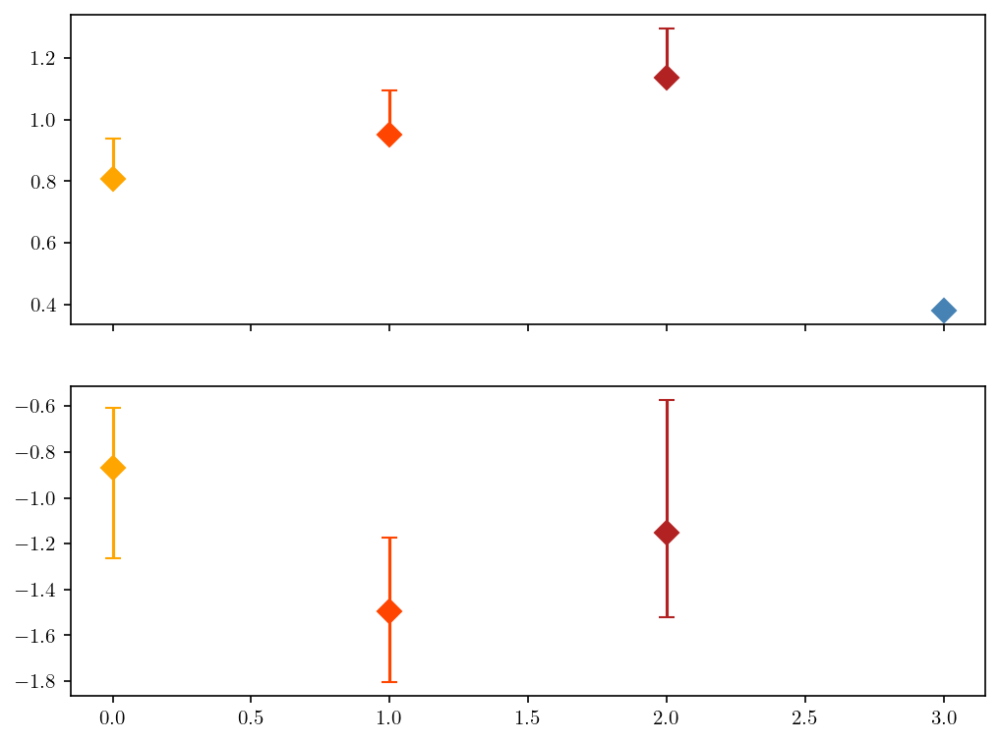

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from common import TRACERS, ZBINS, CHAIN_DIR

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

root = CHAIN_DIR / 'joint_dr1_windowed'
data = np.loadtxt(f'{root}.txt')
minuslogpost = data[:, 1]
params = data[:, 2:]  # h, ombh2, omch2, logA, ns, then b1/b2 per FIT_KEYS entry
best = params[np.argmin(minuslogpost)]

fig, (ax_b1, ax_b2) = plt.subplots(2, 1, figsize=(8, 6), sharex=True)

for i, key in enumerate(FIT_KEYS):
    color = TRACER_COLORS[key]
    b1_col, b2_col = 5 + 2 * i, 5 + 2 * i + 1
    b1_samples, b2_samples = params[:, b1_col], params[:, b2_col]

    # marginalized 68% CI (16th-84th percentile) from the chain, separate from the
    # MAP point below -- these are two different summaries of the posterior and
    # will generally not coincide (MAP need not sit at the marginal median).
    b1_lo, b1_hi = np.percentile(b1_samples, [16, 84])
    b2_lo, b2_hi = np.percentile(b2_samples, [16, 84])
    b1_map, b2_map = best[b1_col], best[b2_col]

    ax_b1.errorbar(i, b1_map, yerr=[[b1_map - b1_lo], [b1_hi - b1_map]],
                    fmt='D', ms=8, color=color, capsize=4)
    ax_b2.errorbar(i, b2_map, yerr=[[b2_map - b2_lo], [b2_hi - b2_map]],
                    fmt='D', ms=8, color=color, capsize=4)

ax_b1.set_ylabel(r'$b_1$')
ax_b2.set_ylabel(r'$b_2$')
ax_b2.set_xticks(range(len(FIT_KEYS)))
ax_b2.set_xticklabels([LEGEND_LABELS[key] for key in FIT_KEYS])
ax_b1.axhline(0, color='0.85', lw=0.8, zorder=0)
ax_b2.axhline(0, color='0.85', lw=0.8, zorder=0)
fig.suptitle('MAP bias parameters per tracer (error bars: marginalized 68% CI)')
fig.tight_layout()
plt.show()

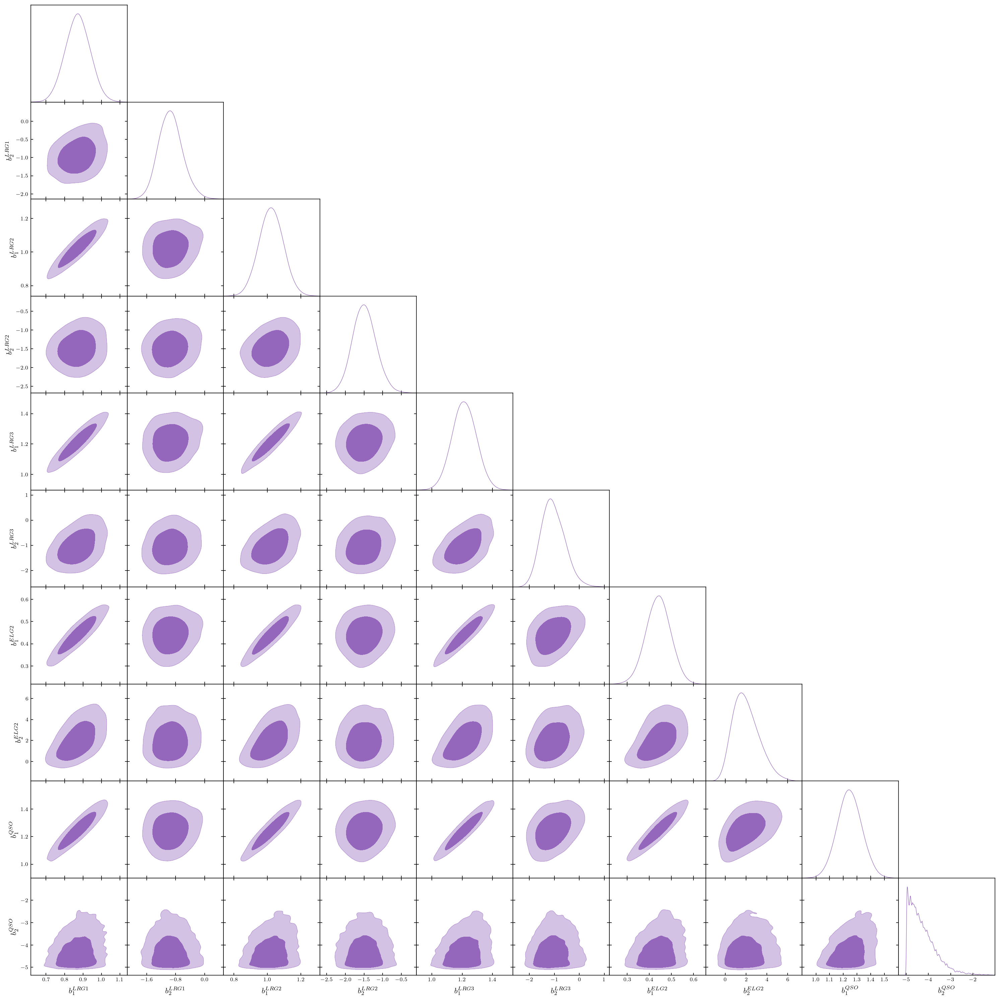

In [13]:
from getdist import loadMCSamples, plots
from common import TRACERS, ZBINS, CHAIN_DIR

LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

root = str(CHAIN_DIR / 'joint_dr1_windowed')
joint = loadMCSamples(root)

# Original saved labels collide across the three LRG z-bins (all "b_1^{LRG}" /
# "b_2^{LRG}", built from tracer name alone in save_getdist_chain) -- relabel
# using the same LEGEND_LABELS convention as the other DR1 plots so the triangle
# is actually distinguishable per tracer/z-bin.
bias_params = []
for tracer, zmin, zmax in FIT_KEYS:
    label = LEGEND_LABELS[(tracer, zmin, zmax)]
    for i, sym in enumerate(['b1', 'b2']):
        pname = f'{sym}_{tracer}_{zmin}_{zmax}'
        bias_params.append(pname)
        par = joint.getParamNames().parWithName(pname)
        par.label = rf'b_{i+1}^{{{label}}}'

g = plots.get_subplot_plotter()
g.triangle_plot([joint], bias_params, filled=True, contour_colors=['tab:purple'])

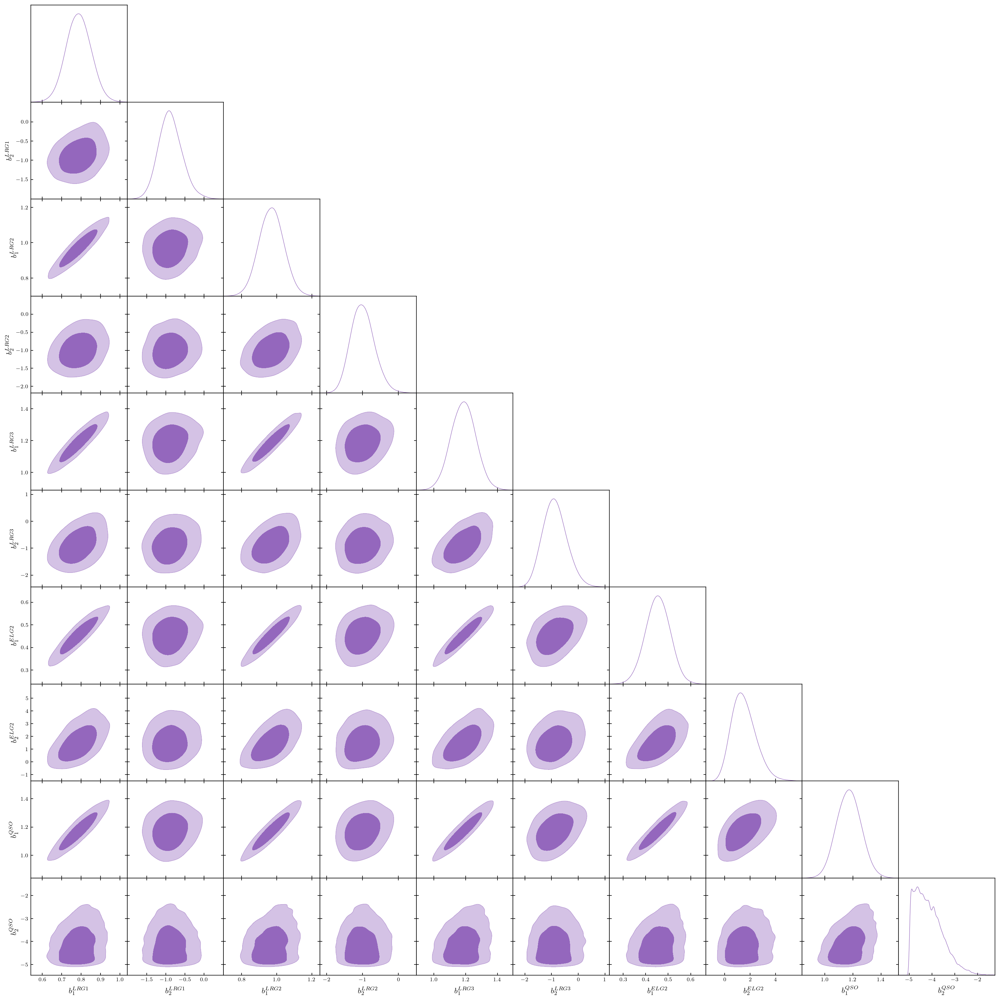

In [14]:
from getdist import loadMCSamples, plots
from common import TRACERS, ZBINS, CHAIN_DIR

LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

root = str(CHAIN_DIR / 'joint_mean_unscaledcov')
mock = loadMCSamples(root)

# Same label collision as the DR1 version (all three LRG z-bins saved as
# "b_1^{LRG}"/"b_2^{LRG}") -- relabel per tracer/z-bin before plotting.
bias_params = []
for tracer, zmin, zmax in FIT_KEYS:
    label = LEGEND_LABELS[(tracer, zmin, zmax)]
    for i, sym in enumerate(['b1', 'b2']):
        pname = f'{sym}_{tracer}_{zmin}_{zmax}'
        bias_params.append(pname)
        par = mock.getParamNames().parWithName(pname)
        par.label = rf'b_{i+1}^{{{label}}}'

g = plots.get_subplot_plotter()
g.triangle_plot([mock], bias_params, filled=True, contour_colors=['tab:purple'])

/spiffball/cosweeney/data/chains/mocks/individual_dr1_windowed_LRG_0.4_0.6.txt
Removed no burn in
/spiffball/cosweeney/data/chains/mocks/individual_dr1_windowed_LRG_0.6_0.8.txt
Removed no burn in
/spiffball/cosweeney/data/chains/mocks/individual_dr1_windowed_LRG_0.8_1.1.txt
Removed no burn in
/spiffball/cosweeney/data/chains/mocks/individual_dr1_windowed_ELG_LOPnotqso_1.1_1.6.txt
Removed no burn in
/spiffball/cosweeney/data/chains/mocks/individual_dr1_windowed_QSO_0.8_2.1.txt
Removed no burn in


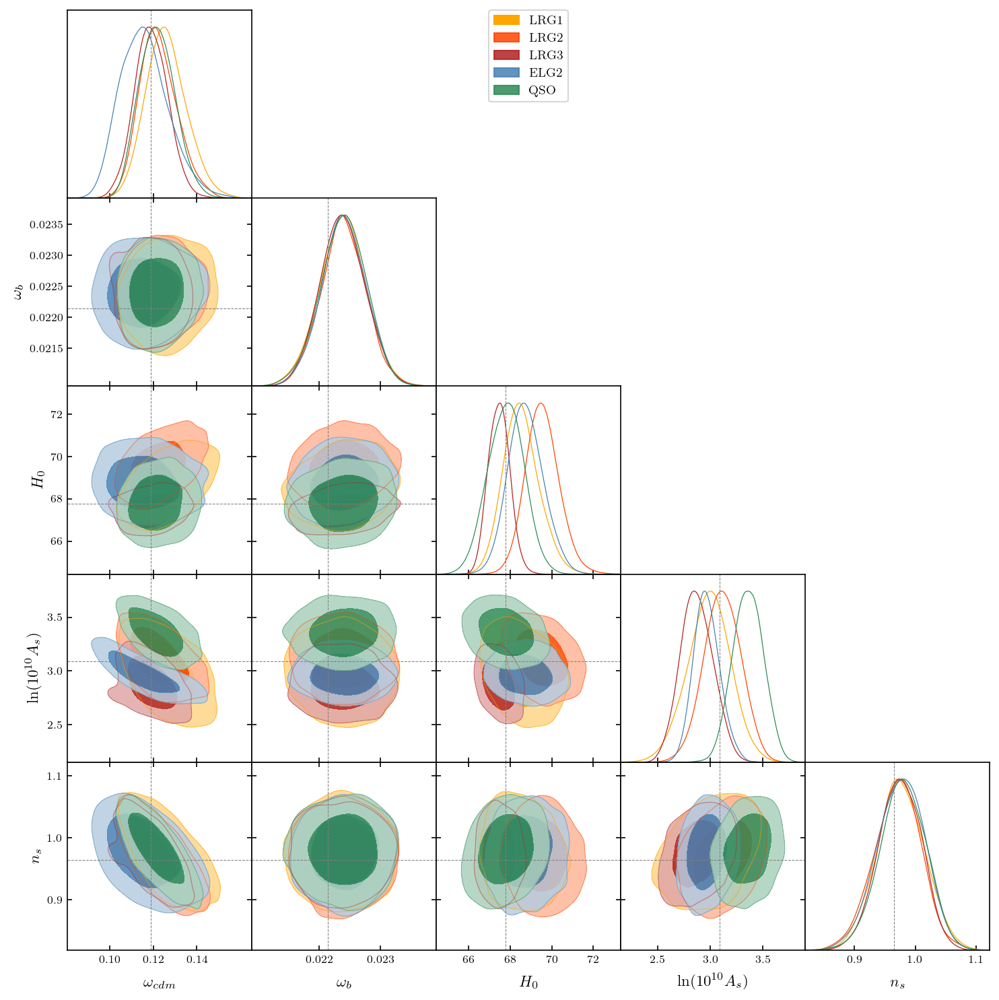

In [15]:
from getdist import loadMCSamples, plots
from common import TRACERS, ZBINS, CHAIN_DIR, COSMO_FID, LNAS_FID, NS_FIXED

COSMO_PARAMS = ['omch2', 'ombh2', 'H0', 'logA', 'ns']
h_fid, ombh2_fid, omch2_fid, As_fid = COSMO_FID
MARKERS = {'H0': 100. * h_fid, 'ombh2': ombh2_fid, 'omch2': omch2_fid, 'logA': LNAS_FID, 'ns': NS_FIXED}

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

samples = []
colors = []
labels = []
for key in FIT_KEYS:
    tracer, zmin, zmax = key
    root = str(CHAIN_DIR / f'individual_dr1_windowed_{tracer}_{zmin}_{zmax}')
    s = loadMCSamples(root)
    s.addDerived(100. * s.getParams().h, name='H0', label='H_0')
    samples.append(s)
    colors.append(TRACER_COLORS[key])
    labels.append(LEGEND_LABELS[key])

g = plots.get_subplot_plotter()
g.triangle_plot(samples, COSMO_PARAMS, filled=True,
                 contour_colors=colors, line_args=[{'color': c} for c in colors],
                 legend_labels=labels, markers=MARKERS)

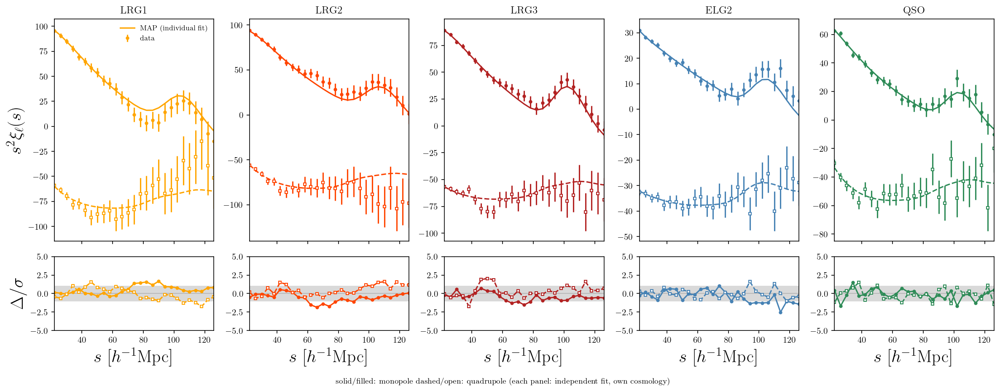

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from common import TRACERS, ZBINS, Z_EFF, get_emulators_cached, CHAIN_DIR
from fit_joint_DR1_windowed_test import load_dr1_tracer_arrays, model_multipoles_windowed, NRAN

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

n_fits = len(FIT_KEYS)
fig, axes = plt.subplots(2, n_fits, figsize=(3.2 * n_fits, 6), sharex='col',
                          gridspec_kw={'height_ratios': [3, 1]})

for col, key in enumerate(FIT_KEYS):
    tracer, zmin, zmax = key
    color = TRACER_COLORS[key]
    ax_top, ax_bot = axes[0, col], axes[1, col]

    # Each tracer has its own independent chain here -- no shared cosmology across
    # columns, unlike the joint-fit version of this plot. theta_i is read straight
    # from that tracer's own MAP row: columns are [weight, -logpost, h, ombh2,
    # omch2, logA, b1, b2, ns], matching PARAM_NAMES_7's order exactly, so no
    # reordering is needed before passing to model_multipoles_windowed.
    root = CHAIN_DIR / f'individual_dr1_windowed_{tracer}_{zmin}_{zmax}'
    chain = np.loadtxt(f'{root}.txt')
    best = chain[np.argmin(chain[:, 1])]
    theta_i = best[2:2 + 7]

    z_eff = Z_EFF[key]
    nran = NRAN[tracer]
    s_data, data_vec, cov, W = load_dr1_tracer_arrays(tracer, zmin, zmax, nran)
    n_per_ell = len(s_data)
    err = np.sqrt(np.diag(cov))

    emus = get_emulators_cached(z_eff)
    model = model_multipoles_windowed(theta_i, emus, z_eff, s_data, W)

    xi0_d, xi2_d = np.split(data_vec, 2)
    xi0_m, xi2_m = np.split(model, 2)
    err0, err2 = err[:n_per_ell], err[n_per_ell:]

    ax_top.errorbar(s_data, s_data**2 * xi0_d, s_data**2 * err0, fmt='o', ms=3, color=color, label='data')
    ax_top.errorbar(s_data, s_data**2 * xi2_d, s_data**2 * err2, fmt='s', ms=3, mfc='white', color=color)
    ax_top.plot(s_data, s_data**2 * xi0_m, '-', color=color, label='MAP (individual fit)')
    ax_top.plot(s_data, s_data**2 * xi2_m, '--', color=color)
    ax_top.set_title(LEGEND_LABELS[key])
    ax_top.margins(x=0)

    ax_bot.axhspan(-1, 1, color='0.85', zorder=0)
    ax_bot.axhline(0, color='0.7', lw=0.8)
    ax_bot.plot(s_data, (xi0_m - xi0_d) / err0, 'o-', ms=3, color=color)
    ax_bot.plot(s_data, (xi2_m - xi2_d) / err2, 's--', ms=3, mfc='white', color=color)
    ax_bot.set_ylim(-5, 5)
    ax_bot.margins(x=0)
    ax_bot.set_xlabel(r'$s\ [h^{-1}\mathrm{Mpc}]$')

axes[0, 0].set_ylabel(r'$s^2\xi_\ell(s)$')
axes[1, 0].set_ylabel(r'$\Delta/\sigma$')
axes[0, 0].legend(frameon=False, fontsize=8)
fig.text(0.5, -0.02, 'solid/filled: monopole    dashed/open: quadrupole    '
                      '(each panel: independent fit, own cosmology)', ha='center', fontsize=9)
fig.tight_layout()
plt.show()

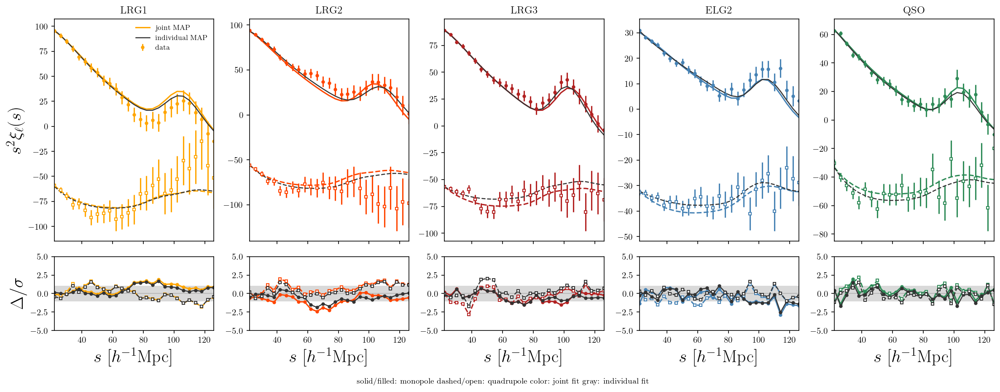

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from common import TRACERS, ZBINS, Z_EFF, get_emulators_cached, CHAIN_DIR

TRACER_COLORS = {
    ('LRG', 0.4, 0.6): 'orange', ('LRG', 0.6, 0.8): 'orangered', ('LRG', 0.8, 1.1): 'firebrick',
    ('ELG_LOPnotqso', 1.1, 1.6): 'steelblue', ('QSO', 0.8, 2.1): 'seagreen',
}
LEGEND_LABELS = {
    ('LRG', 0.4, 0.6): 'LRG1', ('LRG', 0.6, 0.8): 'LRG2', ('LRG', 0.8, 1.1): 'LRG3',
    ('ELG_LOPnotqso', 1.1, 1.6): 'ELG2', ('QSO', 0.8, 2.1): 'QSO',
}
FIT_KEYS = [(tracer, zmin, zmax) for tracer, prog in TRACERS.items() for zmin, zmax in ZBINS[tracer]]

# joint chain: one shared cosmology (first 5 columns after weight/-logpost) plus
# b1,b2 per tracer in FIT_KEYS order
joint_root = CHAIN_DIR / 'joint_dr1_windowed'
joint_chain = np.loadtxt(f'{joint_root}.txt')
joint_best = joint_chain[np.argmin(joint_chain[:, 1])]
joint_theta_full = joint_best[2:]
h_j, ombh2_j, omch2_j, lnAs_j, ns_j = joint_theta_full[:5]

n_fits = len(FIT_KEYS)
fig, axes = plt.subplots(2, n_fits, figsize=(3.2 * n_fits, 6), sharex='col',
                          gridspec_kw={'height_ratios': [3, 1]})

for col, key in enumerate(FIT_KEYS):
    tracer, zmin, zmax = key
    color = TRACER_COLORS[key]
    ax_top, ax_bot = axes[0, col], axes[1, col]

    z_eff = Z_EFF[key]
    nran = NRAN[tracer]
    s_data, data_vec, cov, W = load_dr1_tracer_arrays(tracer, zmin, zmax, nran)
    n_per_ell = len(s_data)
    err = np.sqrt(np.diag(cov))
    emus = get_emulators_cached(z_eff)

    # joint-fit model: shared cosmology, this tracer's slice of b1/b2
    b1_j, b2_j = joint_theta_full[5 + 2 * col], joint_theta_full[5 + 2 * col + 1]
    theta_joint = [h_j, ombh2_j, omch2_j, lnAs_j, b1_j, b2_j, ns_j]
    model_joint = model_multipoles_windowed(theta_joint, emus, z_eff, s_data, W)

    # individual-fit model: this tracer's own chain, own cosmology, own b1/b2
    ind_root = CHAIN_DIR / f'individual_dr1_windowed_{tracer}_{zmin}_{zmax}'
    ind_chain = np.loadtxt(f'{ind_root}.txt')
    theta_ind = ind_chain[np.argmin(ind_chain[:, 1])][2:2 + 7]
    model_ind = model_multipoles_windowed(theta_ind, emus, z_eff, s_data, W)

    xi0_d, xi2_d = np.split(data_vec, 2)
    xi0_j, xi2_j = np.split(model_joint, 2)
    xi0_i, xi2_i = np.split(model_ind, 2)
    err0, err2 = err[:n_per_ell], err[n_per_ell:]

    ax_top.errorbar(s_data, s_data**2 * xi0_d, s_data**2 * err0, fmt='o', ms=3, color=color, label='data')
    ax_top.errorbar(s_data, s_data**2 * xi2_d, s_data**2 * err2, fmt='s', ms=3, mfc='white', color=color)
    ax_top.plot(s_data, s_data**2 * xi0_j, '-', color=color, label='joint MAP')
    ax_top.plot(s_data, s_data**2 * xi2_j, '--', color=color)
    ax_top.plot(s_data, s_data**2 * xi0_i, '-', color='0.2', lw=1.2, label='individual MAP')
    ax_top.plot(s_data, s_data**2 * xi2_i, '--', color='0.2', lw=1.2)
    ax_top.set_title(LEGEND_LABELS[key])
    ax_top.margins(x=0)

    ax_bot.axhspan(-1, 1, color='0.85', zorder=0)
    ax_bot.axhline(0, color='0.7', lw=0.8)
    ax_bot.plot(s_data, (xi0_j - xi0_d) / err0, 'o-', ms=3, color=color)
    ax_bot.plot(s_data, (xi2_j - xi2_d) / err2, 's--', ms=3, mfc='white', color=color)
    ax_bot.plot(s_data, (xi0_i - xi0_d) / err0, 'o-', ms=3, color='0.2', lw=1.2)
    ax_bot.plot(s_data, (xi2_i - xi2_d) / err2, 's--', ms=3, mfc='white', color='0.2', lw=1.2)
    ax_bot.set_ylim(-5, 5)
    ax_bot.margins(x=0)
    ax_bot.set_xlabel(r'$s\ [h^{-1}\mathrm{Mpc}]$')

axes[0, 0].set_ylabel(r'$s^2\xi_\ell(s)$')
axes[1, 0].set_ylabel(r'$\Delta/\sigma$')
axes[0, 0].legend(frameon=False, fontsize=8)
fig.text(0.5, -0.02, 'solid/filled: monopole    dashed/open: quadrupole    '
                      'color: joint fit    gray: individual fit', ha='center', fontsize=9)
fig.tight_layout()
plt.show()